<a href="https://colab.research.google.com/github/sonujain2023/Human-Activity-recognition-/blob/main/Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Step 1: Install All the Required Packages

In [2]:
!pip install ultralytics

# Step 2: Import All the Required Libraries

In [4]:
import ultralytics
from ultralytics import YOLO

# Step 3: Check Ultralytics Version and Setup Completion

In [5]:
ultralytics.checks()

Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.5/112.6 GB disk)


# Step 4: Download the Dataset from Roboflow

In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="hzoVrDHDbdeFNRLoh2Nq")
project = rf.workspace("pose-detection-twxbg").project("human-activity-ce7zu")
version = project.version(2)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...


In [9]:
!mkdir dataset

In [10]:
%cd "/content/dataset/"

/content/dataset


In [12]:
!pwd
%cd /content/

/content/dataset
/content


# Step 5: Load the YOLO11 Model

In [14]:
model = YOLO("yolo11s-pose.pt")

# Step 6: Train the YOLO11 Pose Model

In [15]:
results = model.train(data = "/content/dataset/data.yaml", task = "pose", mode = "train", imgsz = 640, epochs = 50, batch = 8)

Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=pose, mode=train, model=yolo11s-pose.pt, data=/content/dataset/data.yaml, epochs=50, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_b

100%|██████████| 755k/755k [00:00<00:00, 27.7MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 91.0MB/s]


AMP: checks passed ✅


train: Scanning /content/Human-activity-2/train/labels... 1126 images, 3 backgrounds, 3 corrupt: 100%|██████████| 1126/1126 [00:00<00:00, 1544.58it/s]

train: WARNING ⚠️ /content/Human-activity-2/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0048_jpg.rf.3d6a4188d2279fd1b429fcfa0a6ce0eb.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: WARNING ⚠️ /content/Human-activity-2/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0049_jpg.rf.245067ff6f6ebf7ab9b38b346ad24ed7.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: WARNING ⚠️ /content/Human-activity-2/train/images/clideo_editor_3b33d792dfde4f1b8b2dd2fdf082e347_mp4-0050_jpg.rf.0304242590c31d28441b27bb05c37ee5.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0005      1.0158]
train: New cache created: /content/Human-activity-2/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Human-activity-2/valid/labels... 324 images, 0 backgrounds, 0 corrupt: 100%|██████████| 324/324 [00:00<00:00, 561.77it/s]

val: New cache created: /content/Human-activity-2/valid/labels.cache


Plotting labels to runs/pose/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 87 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/pose/train2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.29G      1.432      5.797     0.4302      2.859      1.355          4        640: 100%|██████████| 141/141 [00:32<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.79it/s]

                   all        324        326      0.751      0.616      0.694      0.402      0.346      0.347      0.285      0.077



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.73G      1.424      5.539     0.3754      1.832      1.343          4        640: 100%|██████████| 141/141 [00:28<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.23it/s]


                   all        324        326      0.632       0.68       0.68      0.385      0.388      0.444       0.35      0.107

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.78G      1.459      5.578     0.3873      1.618      1.373          8        640: 100%|██████████| 141/141 [00:27<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.50it/s]


                   all        324        326      0.597      0.759      0.749      0.422      0.416      0.477      0.391      0.114

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.81G      1.459      5.409     0.3724      1.535       1.39          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.41it/s]

                   all        324        326      0.703      0.745      0.759      0.441      0.418      0.428      0.302     0.0797



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.85G      1.411      5.159     0.3589      1.364      1.339          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.55it/s]

                   all        324        326      0.585      0.736      0.728      0.448      0.434      0.512      0.424      0.131



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.89G       1.36      4.785     0.3501       1.32      1.327          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.47it/s]

                   all        324        326      0.792      0.737      0.826      0.506      0.574      0.613       0.55      0.174



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.93G      1.337      4.636     0.3294      1.226      1.286          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.52it/s]

                   all        324        326      0.796      0.827      0.846      0.553      0.635      0.663      0.621      0.263



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.97G       1.31      4.535      0.339      1.159      1.277          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.51it/s]

                   all        324        326      0.839      0.815      0.874      0.577      0.693      0.709      0.691      0.264



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.01G      1.273      4.295     0.3381      1.121      1.248          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.52it/s]

                   all        324        326      0.855      0.849      0.902      0.593      0.745      0.729      0.692      0.237



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.05G      1.239      4.231     0.3229      1.122      1.236          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.45it/s]

                   all        324        326      0.813      0.898      0.903      0.639      0.748      0.691      0.702      0.261



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      11/50       3.1G      1.187      3.952     0.3074      1.033      1.207          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.92it/s]

                   all        324        326      0.799      0.849      0.886       0.62      0.677      0.672      0.676      0.268



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.14G      1.195       4.04     0.3013      1.033      1.206          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.49it/s]

                   all        324        326       0.86      0.856      0.886      0.595       0.73      0.729      0.705      0.308



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.18G      1.155      3.885     0.3029     0.9655      1.202          8        640: 100%|██████████| 141/141 [00:27<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.25it/s]

                   all        324        326      0.855      0.869        0.9      0.648      0.785      0.731      0.748       0.33



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.22G      1.128      3.838     0.3002     0.9481      1.201          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.53it/s]

                   all        324        326      0.859      0.904       0.92      0.663      0.763      0.792       0.74      0.329



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.27G      1.124      3.677     0.2921     0.9121      1.174          4        640: 100%|██████████| 141/141 [00:28<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.45it/s]

                   all        324        326       0.87      0.868      0.931      0.644      0.756      0.776       0.76      0.336



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.31G      1.082      3.578     0.2864     0.8877      1.164          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  5.19it/s]


                   all        324        326      0.861      0.892      0.937      0.662      0.737      0.763      0.761      0.329

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.51G      1.106      3.687     0.2899     0.9052      1.175          7        640: 100%|██████████| 141/141 [00:28<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.44it/s]

                   all        324        326      0.871      0.897      0.929      0.684      0.774        0.8      0.782      0.393



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.56G      1.095      3.461     0.2712     0.8865      1.156          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.83it/s]

                   all        324        326      0.849      0.943      0.936      0.679      0.754      0.841      0.802      0.388



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      19/50       3.6G      1.069      3.408     0.2669     0.8402      1.155          2        640: 100%|██████████| 141/141 [00:27<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.57it/s]

                   all        324        326      0.867      0.883      0.915      0.661      0.794      0.806      0.769       0.38



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.64G      1.068      3.395     0.2657     0.8595       1.15          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.75it/s]

                   all        324        326      0.848      0.921      0.942      0.696       0.77      0.821      0.813      0.387



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.68G      1.043      3.324     0.2649     0.8104      1.132          9        640: 100%|██████████| 141/141 [00:27<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.54it/s]

                   all        324        326      0.892      0.894      0.945      0.682      0.803      0.813      0.809      0.356



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.73G      1.023      3.204     0.2696     0.7979      1.135          6        640: 100%|██████████| 141/141 [00:27<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.56it/s]

                   all        324        326      0.899      0.923      0.948      0.705      0.798      0.808       0.82      0.418



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.77G      1.008      3.211     0.2571     0.8008      1.119          4        640: 100%|██████████| 141/141 [00:26<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.48it/s]

                   all        324        326      0.893      0.892      0.938      0.699      0.814      0.816      0.828      0.437



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.81G      1.039      3.299     0.2584     0.8096      1.147          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.55it/s]

                   all        324        326      0.889      0.897      0.939      0.711      0.821      0.841      0.855      0.459



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.85G     0.9776      3.017     0.2523     0.7374      1.099          9        640: 100%|██████████| 141/141 [00:27<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.58it/s]

                   all        324        326      0.874      0.929      0.944      0.709      0.848      0.823      0.853      0.408



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      26/50       3.9G     0.9584      3.033     0.2504     0.7619      1.107          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.60it/s]

                   all        324        326      0.884       0.91       0.95      0.721       0.84      0.829      0.876      0.438



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.94G     0.9861      2.979     0.2551     0.7579      1.113          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.61it/s]

                   all        324        326      0.911       0.91      0.943       0.72      0.841      0.848      0.838       0.46



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.98G     0.9844      2.931     0.2461     0.7531      1.112          2        640: 100%|██████████| 141/141 [00:27<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.61it/s]

                   all        324        326      0.921      0.908       0.95      0.724      0.868      0.848      0.871      0.503



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      29/50      4.02G     0.9584      2.822     0.2553     0.7513      1.094          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.47it/s]

                   all        324        326      0.873      0.902      0.943      0.722      0.809      0.831      0.869      0.452



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      30/50      4.07G     0.9215        2.7      0.238     0.7213      1.097          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.58it/s]

                   all        324        326      0.898      0.919      0.946      0.723      0.853      0.872      0.889      0.464



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      31/50      4.11G     0.9147      2.784     0.2428     0.6895      1.079          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.51it/s]

                   all        324        326      0.899      0.907       0.95       0.73      0.864      0.861      0.886      0.528



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.15G     0.9303      2.656     0.2375     0.7037      1.091          1        640: 100%|██████████| 141/141 [00:27<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.58it/s]

                   all        324        326      0.921      0.917      0.962      0.727      0.884      0.875      0.904      0.498



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.19G     0.9025      2.633     0.2358     0.6807      1.081          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.47it/s]

                   all        324        326      0.914      0.889      0.956      0.741       0.88      0.853      0.913      0.523



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.24G     0.8881      2.572     0.2277     0.6837      1.065         10        640: 100%|██████████| 141/141 [00:27<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.59it/s]

                   all        324        326      0.938      0.903      0.958      0.746      0.912      0.876      0.917       0.54



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.28G      0.888       2.58     0.2283     0.6624       1.07          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.51it/s]

                   all        324        326      0.944      0.901      0.966      0.744      0.908      0.839        0.9      0.541



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.32G     0.8592      2.481     0.2354     0.6557      1.063          2        640: 100%|██████████| 141/141 [00:27<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.53it/s]

                   all        324        326      0.915      0.933      0.962      0.754      0.868      0.881        0.9      0.517



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.36G     0.8643      2.439     0.2263     0.6474      1.062          4        640: 100%|██████████| 141/141 [00:27<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.54it/s]

                   all        324        326      0.905      0.944      0.951      0.747      0.865      0.902        0.9      0.565



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.41G     0.8709      2.453     0.2265     0.6613      1.079          5        640: 100%|██████████| 141/141 [00:27<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.51it/s]

                   all        324        326       0.92      0.923      0.958      0.748      0.878      0.878      0.903      0.563



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.45G     0.8369      2.439      0.235     0.6292      1.044          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.59it/s]

                   all        324        326      0.924      0.933      0.958      0.758      0.895      0.902      0.915      0.574



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.49G     0.8483      2.387      0.221     0.6447      1.052          7        640: 100%|██████████| 141/141 [00:27<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.64it/s]

                   all        324        326      0.892       0.93      0.962      0.761      0.866      0.901      0.925      0.584


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.55G     0.7531      1.802     0.1895     0.5258      1.034          3        640: 100%|██████████| 141/141 [00:28<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.57it/s]

                   all        324        326      0.918       0.92      0.956      0.759       0.89      0.877      0.909      0.581



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.59G     0.7245      1.697     0.1888     0.4979      1.006          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.48it/s]

                   all        324        326      0.925      0.902      0.958      0.758      0.906      0.865      0.925      0.589



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.63G      0.727      1.637     0.1806     0.4959      1.009          3        640: 100%|██████████| 141/141 [00:26<00:00,  5.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.60it/s]

                   all        324        326       0.94      0.931      0.962      0.771       0.91      0.894      0.908       0.59



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      44/50       4.7G     0.6983      1.588     0.1755     0.4773      1.012          3        640: 100%|██████████| 141/141 [00:27<00:00,  5.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.84it/s]

                   all        324        326      0.919      0.957      0.957      0.771      0.903       0.93      0.934      0.605



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.77G     0.6846      1.584     0.1734     0.4703     0.9948          3        640: 100%|██████████| 141/141 [00:26<00:00,  5.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.59it/s]

                   all        324        326      0.939      0.937      0.966      0.778      0.912       0.91      0.932      0.611



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.83G     0.6806      1.527     0.1755     0.4611     0.9904          3        640: 100%|██████████| 141/141 [00:26<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.58it/s]

                   all        324        326      0.932      0.926      0.966       0.78      0.916      0.906      0.941      0.619



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.87G      0.683      1.518      0.179     0.4725     0.9993          3        640: 100%|██████████| 141/141 [00:26<00:00,  5.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.51it/s]

                   all        324        326      0.927      0.945      0.967      0.777      0.907      0.924      0.944      0.634



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.93G     0.6537      1.469     0.1644     0.4431     0.9752          3        640: 100%|██████████| 141/141 [00:26<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.48it/s]

                   all        324        326      0.929      0.944      0.963      0.778      0.907      0.921      0.937      0.627



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.99G     0.6445      1.433     0.1664      0.442     0.9715          3        640: 100%|██████████| 141/141 [00:26<00:00,  5.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:03<00:00,  5.54it/s]

                   all        324        326      0.933      0.929      0.962      0.782      0.929      0.894      0.937      0.635



      Epoch    GPU_mem   box_loss  pose_loss  kobj_loss   cls_loss   dfl_loss  Instances       Size


      50/50      5.05G     0.6361      1.421     0.1654     0.4406     0.9802          3        640: 100%|██████████| 141/141 [00:26<00:00,  5.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:04<00:00,  4.72it/s]

                   all        324        326      0.928      0.929      0.963      0.785      0.927      0.897      0.938      0.642



50 epochs completed in 0.449 hours.
Optimizer stripped from runs/pose/train2/weights/last.pt, 20.2MB
Optimizer stripped from runs/pose/train2/weights/best.pt, 20.2MB

Validating runs/pose/train2/weights/best.pt...
Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-pose summary (fused): 109 layers, 9,904,101 parameters, 0 gradients, 23.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:06<00:00,  3.36it/s]


                   all        324        326      0.928      0.929      0.964      0.785      0.927      0.897      0.938      0.641
             Fall-Down         91         91      0.989       0.96      0.986      0.871      0.942      0.912      0.913      0.727
               Sitting        104        104      0.961          1      0.993      0.913      0.949      0.971      0.976      0.732
              Standing         84         84      0.935      0.863      0.963      0.686      0.973      0.855      0.974      0.627
               Walking         47         47      0.827      0.894      0.911      0.671      0.845      0.851       0.89       0.48
Speed: 0.5ms preprocess, 6.0ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to runs/pose/train2


# Step 7: Validate Custom Model

In [16]:
#Validate the Model
metrics = model.val()

Ultralytics 8.3.100 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11s-pose summary (fused): 109 layers, 9,904,101 parameters, 0 gradients, 23.1 GFLOPs


val: Scanning /content/Human-activity-2/valid/labels.cache... 324 images, 0 backgrounds, 0 corrupt: 100%|██████████| 324/324 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Pose(P          R      mAP50  mAP50-95): 100%|██████████| 41/41 [00:07<00:00,  5.57it/s]


                   all        324        326      0.929      0.929      0.964      0.785      0.925      0.895      0.938       0.64
             Fall-Down         91         91      0.989       0.96      0.987      0.873      0.942      0.912      0.914      0.723
               Sitting        104        104      0.962          1      0.993      0.912      0.954      0.971      0.976      0.731
              Standing         84         84      0.935      0.862      0.963      0.684       0.96      0.845      0.973      0.628
               Walking         47         47      0.831      0.894      0.911      0.671      0.843      0.851       0.89      0.478
Speed: 1.7ms preprocess, 12.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/pose/train22


In [17]:
metrics.box.map

np.float64(0.7848768154907966)

In [18]:
metrics.box.map50

np.float64(0.9635291121081665)

In [19]:
metrics.box.map75

np.float64(0.8622253871422031)

In [20]:
metrics.box.maps

array([    0.87287,     0.91183,     0.68407,     0.67074])

# Step 8: Results Analysis

**Confusion Matrix**

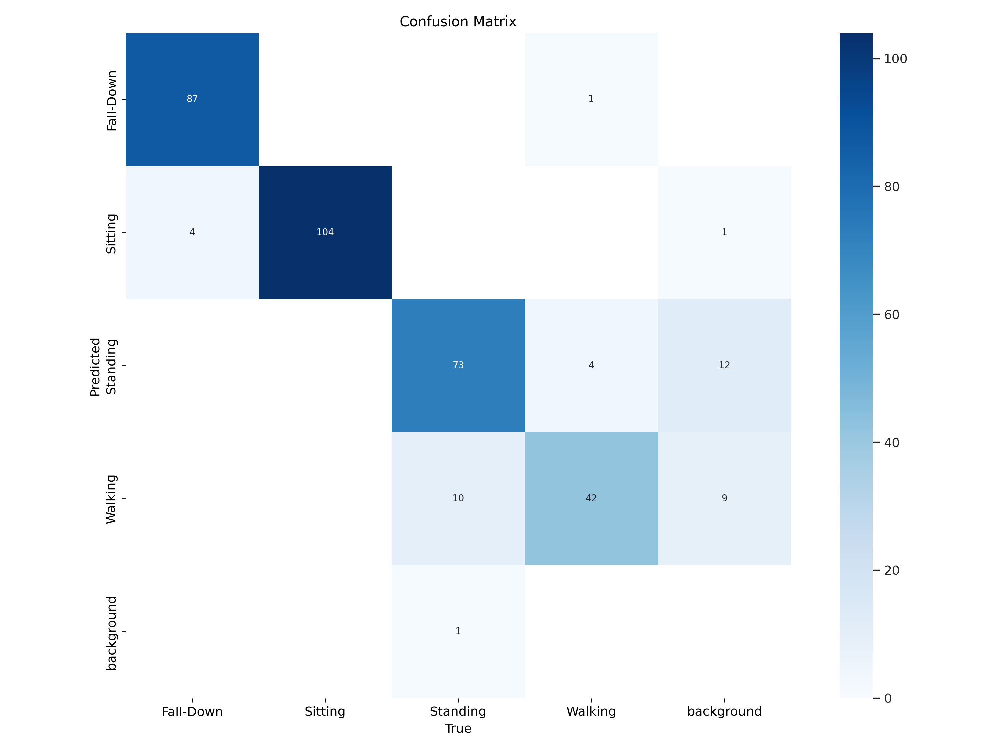

In [21]:
from IPython.display import Image, display
Image("/content/runs/pose/train2/confusion_matrix.png", width = 800)

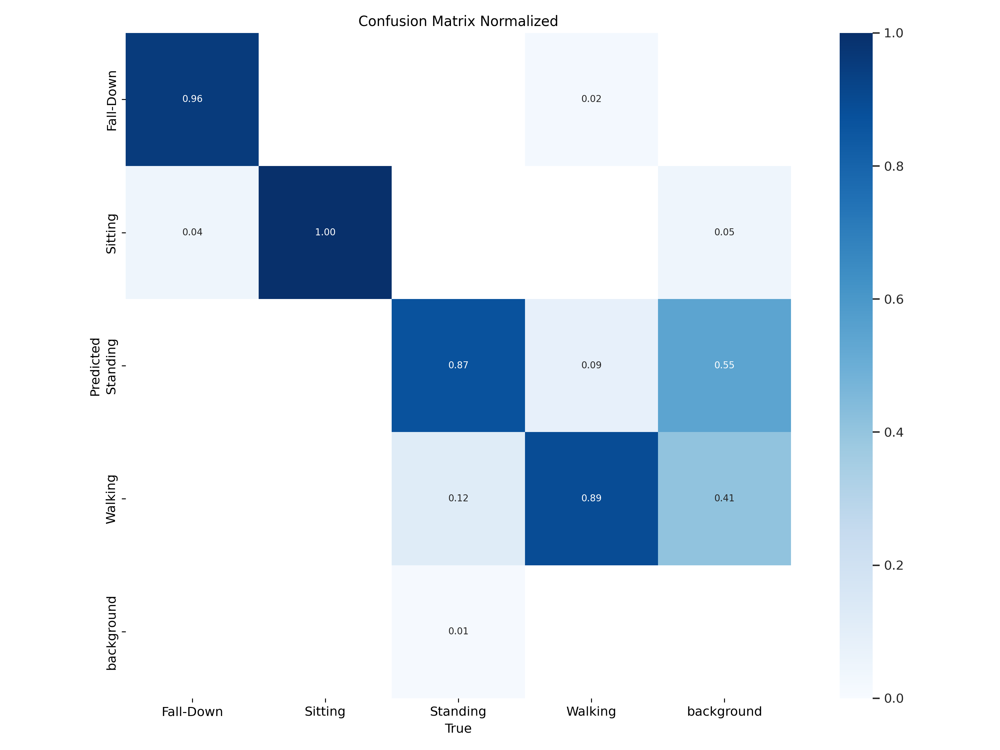

In [22]:
from IPython.display import Image, display
Image("/content/runs/pose/train2/confusion_matrix_normalized.png", width = 800)

Percision Curve

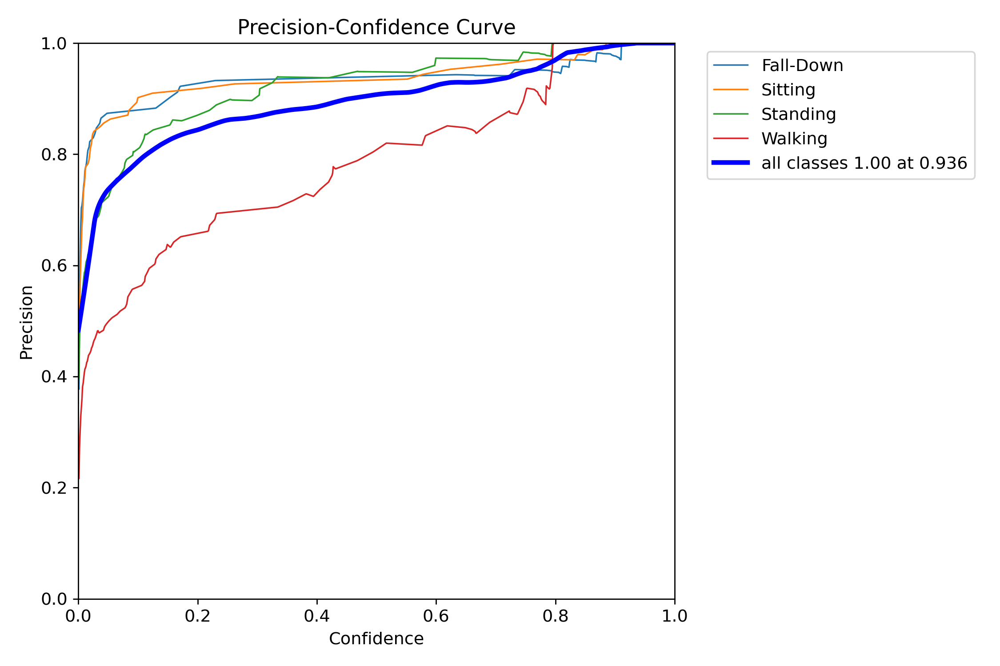

In [23]:
Image("/content/runs/pose/train2/PoseP_curve.png", width = 800)

Recall Curve

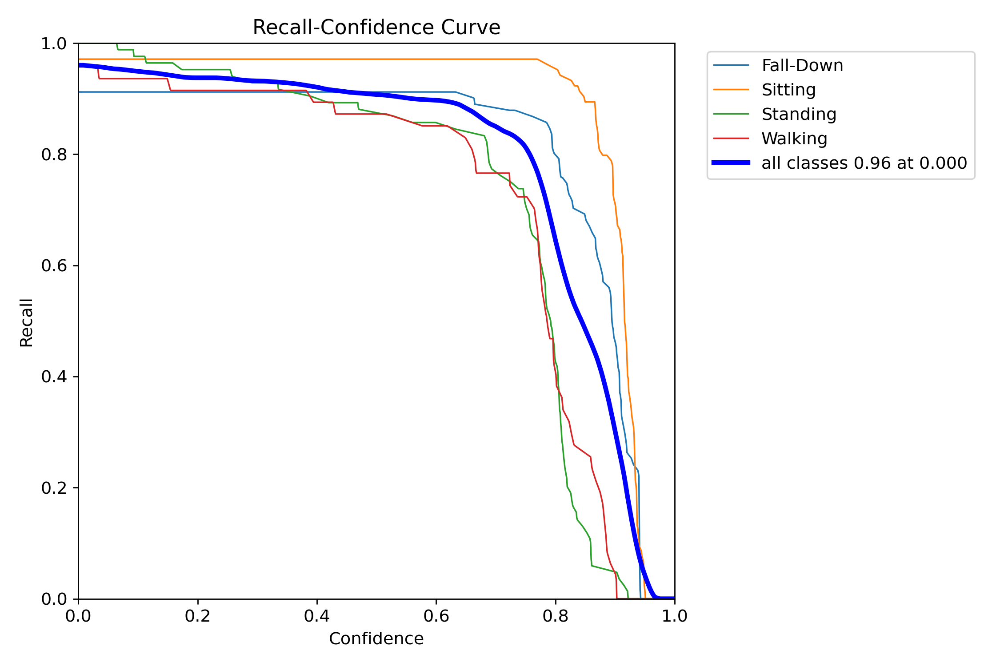

In [24]:
Image("/content/runs/pose/train2/PoseR_curve.png", width = 800)

Model Predictions on Validation Batch

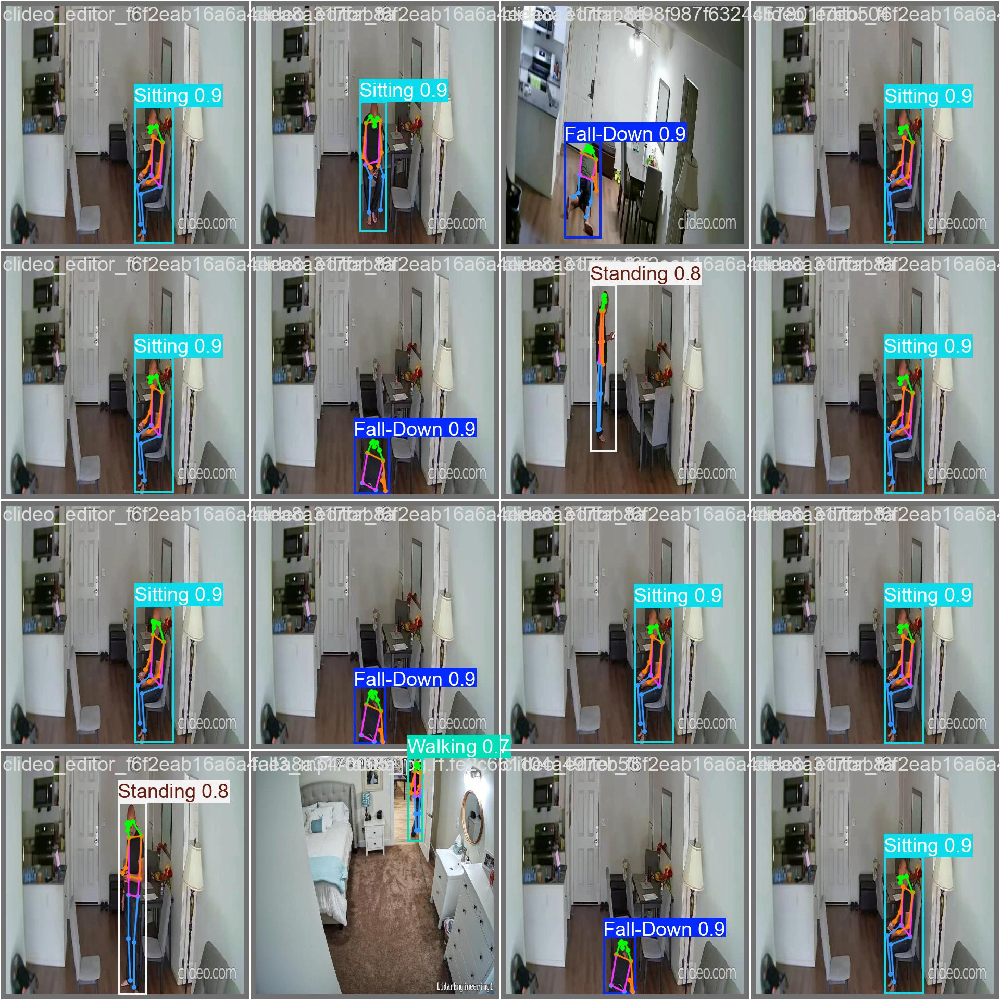

In [25]:
Image("/content/runs/pose/train2/val_batch1_pred.jpg", width = 800)

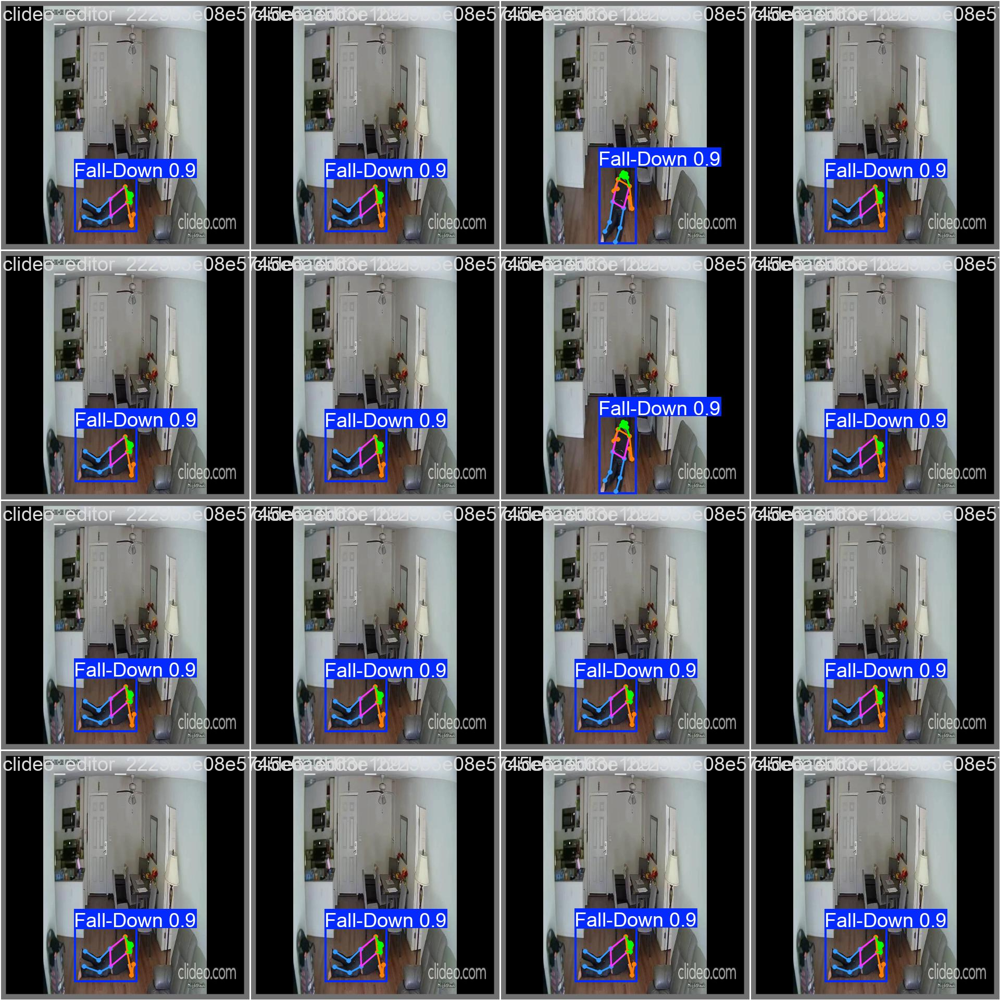

In [26]:
Image("/content/runs/pose/train2/val_batch2_pred.jpg", width = 800)

# Step 9: Inference on Test Dataset Images using the Trained/ Fine-Tune Pose Estimation Model

In [31]:
#Load Trained Model
model = YOLO("/content/best.pt")
#Specify the test folder path
test_path = "/content/Human-activity-2/test/images"
#List all the images in the test folder
import os
image_files = [os.path.join(test_path, img) for img in os.listdir(test_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

#Predict each images
for img_path in image_files:
  results = model.predict(source = img_path, save = True, conf = 0.25)


image 1/1 /content/Human-activity-2/test/images/clideo_editor_454ae88c0d8f4113a208876eb58e9b67_mp4-0318_jpg.rf.a422247ea268417e85cdf5e0f334e817.jpg: 640x640 1 Sitting, 17.1ms
Speed: 2.4ms preprocess, 17.1ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/Human-activity-2/test/images/clideo_editor_99c39affb45e4eb2850bdb91f5b20b7b_mp4-0082_jpg.rf.ec16c1ea9d253ed6c6b19834142b26e3.jpg: 640x640 1 Sitting, 17.0ms
Speed: 2.2ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/Human-activity-2/test/images/Screenshot-2024-09-25-at-8-43-41-PM_png.rf.1b34e7fd2dfc832c10eb8b0968fe403e.jpg: 640x640 1 Standing, 1 Walking, 17.0ms
Speed: 2.0ms preprocess, 17.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/pose/predict

image 1/1 /content/Human-activity-2/test/images/clideo_editor_454ae88c0d8f4113a2088

Step 10: Plot Prediction on Test Images

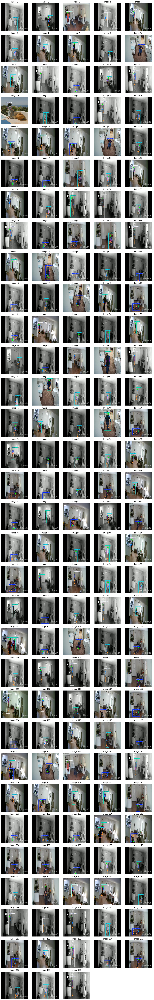

In [32]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Plot prediction on test images

# Specify the predict folder path
pred_path = '/content/runs/pose/predict'

# List all images in the predict folder
pred_image_files = [os.path.join(pred_path, img) for img in os.listdir(pred_path) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Number of images per row
images_per_row = 5

# Calculate the number of rows needed
n_rows = len(pred_image_files) // images_per_row + int(len(pred_image_files) % images_per_row != 0)

# Set figure size
fig, axs = plt.subplots(n_rows, images_per_row, figsize=(15, 3 * n_rows))

# Flatten axes if necessary (for easier iteration)
axs = axs.flatten()

# Loop through each image and display it
for i, img_path in enumerate(pred_image_files):
    img = mpimg.imread(img_path)      # Read the image
    axs[i].imshow(img)                # Show the image
    axs[i].axis('off')                # Turn off axis
    axs[i].set_title(f"Image {i+1}")  # Add title

# Hide any extra empty subplots (if the number of images is not a perfect multiple of images_per_row)
for j in range(i+1, len(axs)):
    axs[j].axis('off')  # Hide unused axes

# Display all images
plt.tight_layout()
plt.show()


# Step 11: Inference on Video

In [33]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [34]:
results = model.predict(source = "/content/video1.mp4", save = True, conf = 0.25, iou = 0.2)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/272) /content/video1.mp4: 384x640 (no detections), 70.3ms
video 1/1 (frame 2/272) /content/video1.mp4: 384x640 (no detections), 20.2ms
video 1/1 (frame 3/272) /content/video1.mp4: 384x640 (no detections), 21.4ms
video 1/1 (frame 4/272) /content/video1.mp4: 384x640 (no detections), 21.6ms
video 1/1 (frame 5/272) /content/video1.mp4: 384x640 (no detections), 19.9ms
video 1/1 (frame 6/272) /content/video1.mp4: 384x640 (no detections), 2

In [36]:
!rm "/content/result_compressed.mp4"

rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [37]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/pose/predict/video1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)